# <img src="https://marcello-sega.github.io/pytim/_static/logo.png" alt="logo" style="width: 50px;display: inline-block;"/> Working with mixed interfaces

When more than one chemical species are present in a mixture, the interface has a more complex nature and can include moelcule from both species. `PYTIM` handles this by merging the largest cluster of the reference component with the smaller clusters of the other components, and then calculating the interface with respect to this larger group of molecules. Let's see an example in detail (a benzene / ionic liquid interface) :

In [1]:
import MDAnalysis as mda
import pytim
from pytim.datafiles import ILBENZENE_GRO
import numpy as np
import nglview as nv

In [2]:
# Benzene / BMIM NTf6 mixture 
u = mda.Universe(ILBENZENE_GRO)
# Here benzene has residue name "LIG"
print "The residues are:", np.unique(np.sort(u.atoms.resnames))
mim = u.select_atoms('resname MIM')
nt = u.select_atoms('resname NT')
benz = u.select_atoms('resname LIG')

# All ionic liquid molecules:
il = mim + nt


The residues are: ['LIG' 'MIM' 'NT']


### Our system

Let's have a look at the system (benzene molecules in gray, ionic liquid in blue):
although benzene is clearly partitioned into two regions (with high and low concentration), it forms a percolating network that spans the complete simulation box.

In [4]:
w = nv.show_mdanalysis(u)
w.camera = 'orthographic'
w.center_view()
w.add_unitcell()

w.add_spacefill(selection=il.atoms.indices,opacity=0.5,color='blue')
w.add_spacefill(selection=benz.atoms.indices,opacity=0.5,color='gray')

In [5]:
w.display()

In [6]:
w.render_image()

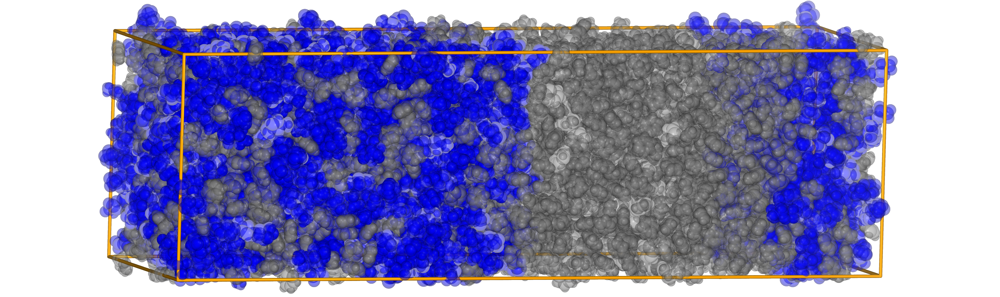

In [7]:
w._display_image()

### Using  the `extra_cluster_groups` option

We now calculate the interface using as a primary reference group the ionic liquid to `ITIM`. In order to tell the program to add to the largest cluster of ionic liquid molecules also the smaller clusters of benzene, we pass here `extra_cluster_groups=[benz]`. 

In calculating the clusters, we need to be careful in this case, because of the percolation of benzene. The `DBSCAN` option has to be used in this case, by passing `cluster_threshold_density='auto'` to `ITIM`, and enlarging the cluster cutoff to enhance the statistics of neighbor calculations. 

In [8]:
inter = pytim.ITIM(universe=u,group=il,extra_cluster_groups=[benz],
                   cluster_cut=9.0,cluster_threshold_density='auto',
                   molecular=True)

Let's have a look at the composition of our interface:

In [9]:
print "Residues present at the interface:", np.unique(inter.atoms.resnames)
n_surf_molecules = inter.atoms.residues.n_residues * 1.0 
print "Fraction of surface benzene:", np.sum(inter.atoms.residues.resnames=='LIG')/n_surf_molecules
print "Fraction of surface ILs:", np.sum(inter.atoms.residues.resnames!='LIG')/n_surf_molecules

Residues present at the interface: ['LIG' 'MIM' 'NT']
Fraction of surface benzene: 0.492063492063
Fraction of surface ILs: 0.507936507937


So, roughly 50% of the surface molecules are benzene, and 50% are ionic liquid ones.

### Visualizing the mixed interface

We show the IL in blue, surface benzene in gray and surface IL in red:

In [10]:
w.clear_representations()
w.center_view()
w.add_unitcell()
w.add_spacefill(selection=il.atoms.indices,opacity=0.1,color='blue')
surf_benz = inter.atoms.indices[np.where(inter.atoms.resnames=='LIG')[0]]
surf_IL = inter.atoms.indices[np.where(inter.atoms.resnames!='LIG')[0]]

w.add_spacefill(selection=surf_benz,color='gray')
w.add_spacefill(selection=surf_IL,color='red')

In [11]:
w.display()

In [12]:
w.render_image()

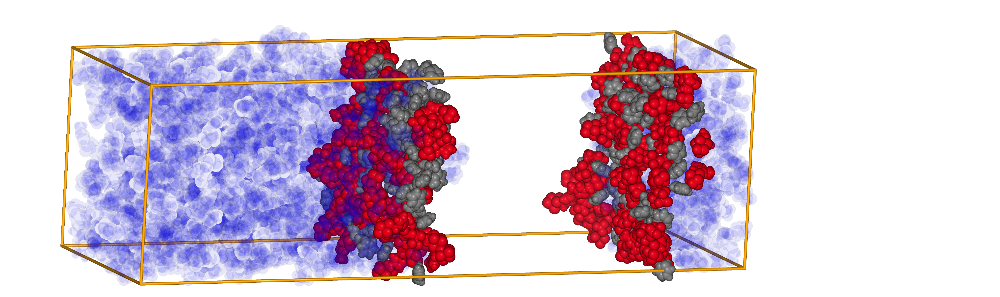

In [13]:
w._display_image()